# Building and Optimizing Decision Tree Models for UFC Fight Outcome Prediction


### Data Loading and Feature Selection

- **Load the dataset**
- **Encode the target variable**: Creates a binary column `red_wins`, where `1` represents a win for the red corner and `0` represents a win for the blue corner.
- **Define features and target**: 
  - Extracts relevant features into `X` (input data), such as differences in knockdowns, strikes, height, etc.
  - Assigns the target variable `red_wins` to `y`, which will be used to train the machine learning model.

In [358]:
import os
import pandas as pd
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image
from sklearn.impute import SimpleImputer  
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
from sklearn.utils.validation import check_is_fitted
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay




# Load the dataset (ensure the file path is correct)
ufc_data_cleaned = pd.read_csv('../data/processed/ufc_data_final.csv')

# Encode target variable: 1 for Red win, 0 for Blue win
ufc_data_cleaned['red_wins'] = (ufc_data_cleaned['winner'] == 'Red').astype(int)


features = [
    'r_age', 'b_age',
    'r_height', 'b_height',
    'r_weight', 'b_weight',
    'r_reach', 'b_reach',
    'r_wins_total', 'b_wins_total',
    'r_losses_total', 'b_losses_total',
    'r_SLpM_total', 'b_SLpM_total',
    'r_SApM_total', 'b_SApM_total',
    'r_sig_str_acc_total', 'b_sig_str_acc_total',
    'r_td_acc_total', 'b_td_acc_total',
    'r_td_def_total', 'b_td_def_total',
    'r_sub_avg', 'b_sub_avg',
    'r_td_avg', 'b_td_avg', 'r_str_def_total', 'b_str_def_total', 'wins_total_diff','age_diff'
]

X = ufc_data_cleaned[features]
y = ufc_data_cleaned['red_wins']


### Decision Tree Visualization and Saving


### Splitting, SMOTE Application, and Model Evaluation

1. **Split the data into training and testing sets (before applying SMOTE):**  
   - The dataset is split into training (`X_train`, `y_train`) and testing (`X_test`, `y_test`) sets using an 80/20 ratio. The random state ensures reproducibility.
   - The sizes of the training and testing sets are printed for verification.

2. **Train a model before applying SMOTE:**  
   - A decision tree classifier with a maximum depth of 5 is trained on the original training data (`X_train`, `y_train`).
   - Predictions are made on the test set (`X_test`), and the model's performance is evaluated using the `classification_report`.

3. **Apply SMOTE to the training data:**  
   - Synthetic Minority Over-sampling Technique (SMOTE) is applied to balance the class distribution in the training set.
   - After applying SMOTE, the new class distribution is printed to verify the balance.

4. **Train a model after applying SMOTE:**  
   - The decision tree classifier is retrained on the resampled data (`X_train_resampled`, `y_train_resampled`).
   - Predictions are again made on the test set, and the updated performance metrics are printed for comparison with the pre-SMOTE model.

In [359]:
# Split the data into training and testing sets (before SMOTE)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Training set size (before SMOTE):", X_train.shape)
print("Testing set size:", X_test.shape)

Training set size (before SMOTE): (5951, 30)
Testing set size: (1488, 30)


In [360]:

# Create a base model without depth limitation
main_model = DecisionTreeClassifier(random_state=42)

# Apply SMOTE
# smote = SMOTE(random_state=42)
# X_resampled, y_resampled = smote.fit_resample(X, y)
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

print("\nTraining set size (after SMOTE):", X_train_resampled.shape)
print("Class distribution in training data after SMOTE:")
print(pd.Series(y_train_resampled).value_counts())
# Function to evaluate a model
def evaluate_model(model, X_train, y_train, X_test, y_test, title="Model Evaluation"):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Metrics
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    print(f"\n=== {title} ===")
    print(f"Accuracy: {accuracy:.2f}")
    print(f"F1-Score: {f1:.2f}")
    print(classification_report(y_test, y_pred, target_names=["Blue Wins", "Red Wins"]))

    # Confusion Matrix
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred, display_labels=["Blue Wins", "Red Wins"], cmap="Blues")
    plt.title(f"Confusion Matrix: {title}")
    plt.show()

    return accuracy, f1





=== Metrics Before SMOTE ===
              precision    recall  f1-score   support

   Blue Wins       0.52      0.50      0.50       517
    Red Wins       0.74      0.75      0.74       971

    accuracy                           0.66      1488
   macro avg       0.63      0.62      0.62      1488
weighted avg       0.66      0.66      0.66      1488


Class Distribution After SMOTE:
red_wins
1    3905
0    3905
Name: count, dtype: int64

=== Metrics After SMOTE ===
              precision    recall  f1-score   support

   Blue Wins       0.50      0.54      0.52       517
    Red Wins       0.75      0.71      0.73       971

    accuracy                           0.65      1488
   macro avg       0.62      0.63      0.63      1488
weighted avg       0.66      0.65      0.66      1488



In [362]:
# Evaluate the main model (Depth=Unlimited)
evaluate_model(main_model, X_train_resampled, y_train_resampled, X_test, y_test, title="Main Model (Depth=Unlimited)")

# Test different depths
depths = [3, 5, 7, 10, None]
results = []

for depth in depths:
    test_model = DecisionTreeClassifier(max_depth=depth, random_state=42, class_weight='balanced')
    accuracy, f1 = evaluate_model(test_model, X_train_resampled, y_train_resampled, X_test, y_test, title=f"Test Model (Depth={depth if depth else 'Unlimited'})")

    results.append({
        "Depth": depth if depth else "Unlimited",
        "Accuracy": accuracy,
        "F1-Score": f1
    })

# Results visualization
results_df = pd.DataFrame(results)
results_df["Depth"] = results_df["Depth"].replace("Unlimited", None).astype(float)

plt.figure(figsize=(10, 6))
plt.plot(results_df["Depth"].fillna(results_df["Depth"].max() + 1), results_df["Accuracy"], label="Accuracy", marker="o")
plt.plot(results_df["Depth"].fillna(results_df["Depth"].max() + 1), results_df["F1-Score"], label="F1-Score", marker="o")
plt.xlabel("Max Depth")
plt.ylabel("Metric Value")
plt.title("Model Performance with Different Depths (After SMOTE)")
plt.legend()
plt.grid()
plt.show()

# Display results as a table
print("\nSummary Results:")
print(results_df)


In [363]:
# Visualize the decision tree
dot_data = export_graphviz(
    main_model,
    out_file=None,
    feature_names=features,
    class_names=['Blue Win', 'Red Win'],
    filled=True,
    rounded=True,
    special_characters=True
)

# Convert to a graph
graph = pydotplus.graph_from_dot_data(dot_data)

# Create the output directory if it doesn't exist
output_dir = 'output_tree_images'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Save the tree image in the specified directory
output_path = os.path.join(output_dir, "decision_tree_visualization.png")
graph.write_png(output_path)

# Display the tree in Jupyter Notebook (optional)
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.559355 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.559355 to fit



In [364]:
# Test different depths and criteria (Gini vs Entropy)
depths = [3, 5, 7, 10, None]
criteria = ['gini', 'entropy']
results = []

for criterion in criteria:
    for depth in depths:
        # Create and evaluate the model
        test_model = DecisionTreeClassifier(max_depth=depth, criterion=criterion, random_state=42)
        accuracy, f1 = evaluate_model(
            test_model,
            X_train,
            y_train,
            X_test,
            y_test,
            title=f"Test Model (Criterion={criterion.capitalize()}, Depth={depth if depth else 'Unlimited'})"
        )
        # Append the results
        results.append({
            "Criterion": criterion.capitalize(),
            "Depth": depth if depth else "Unlimited",
            "Accuracy": accuracy,
            "F1-Score": f1
        })

# Convert results to DataFrame
results_df = pd.DataFrame(results)
results_df["Depth"] = results_df["Depth"].replace("Unlimited", None).astype(float)

# Visualize the results
for criterion in criteria:
    subset = results_df[results_df["Criterion"] == criterion.capitalize()]
    plt.figure(figsize=(10, 6))
    plt.plot(
        subset["Depth"].fillna(subset["Depth"].max() + 1),
        subset["Accuracy"],
        label="Accuracy",
        marker="o"
    )
    plt.plot(
        subset["Depth"].fillna(subset["Depth"].max() + 1),
        subset["F1-Score"],
        label="F1-Score",
        marker="o"
    )
    plt.xlabel("Max Depth")
    plt.ylabel("Metric Value")
    plt.title(f"Model Performance with {criterion.capitalize()} Criterion")
    plt.legend()
    plt.grid()
    plt.show()

# Display the results as a table
print("\nSummary Results:")
print(results_df)


### Train and Visualize Decision Tree with max_depth=5

Updated Model Parameters: {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': 7, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'random_state': 42, 'splitter': 'best'}


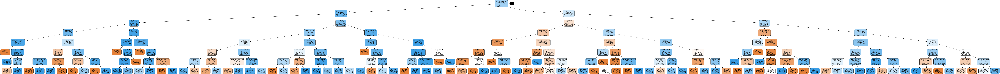

In [365]:
# Set the optimal depth for the main model
main_model.set_params(max_depth=5)

# Train the main model on balanced data (after applying SMOTE)
main_model.fit(X_train, y_train)

# Visualize the decision tree
dot_data = export_graphviz(
    main_model,
    out_file=None,
    feature_names=features,
    class_names=['Blue Win', 'Red Win'],
    filled=True,
    rounded=True,
    special_characters=True
)

# Generate the tree graph
graph = pydotplus.graph_from_dot_data(dot_data)

# Create a directory to store the tree image, if it doesn't already exist
output_dir = 'output_tree_images'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Save the tree image to the specified directory
output_path = os.path.join(output_dir, "decision_tree_max_depth_5_smote.png")
graph.write_png(output_path)

# Confirm the model's parameters (for verification)
print("Updated Model Parameters:", main_model.get_params())

# Display the tree directly in Jupyter Notebook
Image(graph.create_png())


### Visualizing Feature Importance for Decision Tree (Depth = 5)

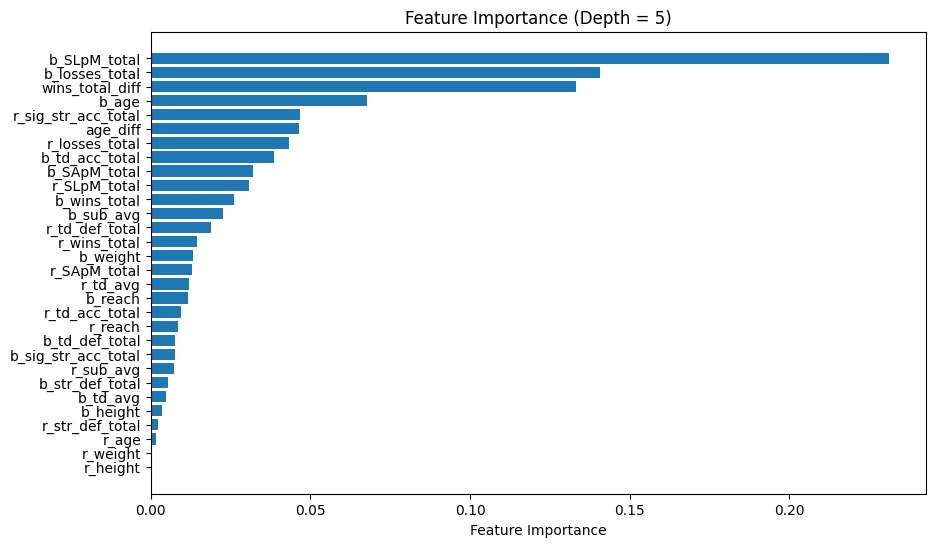

In [366]:
# Feature Importance
import matplotlib.pyplot as plt

# Get feature importances
feature_importances = main_model.feature_importances_

# Sort features by importance
sorted_indices = feature_importances.argsort()[::-1]
sorted_features = [features[i] for i in sorted_indices]

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(sorted_features, feature_importances[sorted_indices])
plt.xlabel('Feature Importance')
plt.title('Feature Importance (Depth = 5)')
plt.gca().invert_yaxis()
plt.show()


In [367]:
# Check the current splitting criterion (e.g., 'gini' or 'entropy')
print("Current Splitting Criterion:", main_model.get_params()['criterion'])


Current Splitting Criterion: gini


### **Hyperparameter Tuning for Decision Tree: GridSearchCV vs RandomizedSearchCV**

This code performs hyperparameter tuning for a decision tree using both **GridSearchCV** (exhaustive search) and **RandomizedSearchCV** (randomized sampling). It identifies the best combination of parameters based on F1-Score and prints the results for comparison.

In [368]:
# Create the decision tree model
tuning_model = DecisionTreeClassifier(random_state=42)

# Define the parameter grid for GridSearchCV
param_grid = {
    'max_depth': [3, 5, 7, 10],
    'criterion': ['gini', 'entropy'],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

param_dist = param_grid 

# 1. GridSearchCV
print("\n=== Running GridSearchCV ===")
grid_search = GridSearchCV(main_model, param_grid, cv=5, scoring='f1')
grid_search.fit(X_train, y_train)

print("Best Parameters (GridSearchCV):", grid_search.best_params_)
print("Best Model (GridSearchCV):", grid_search.best_estimator_)

# 2. RandomizedSearchCV
print("\n=== Running RandomizedSearchCV ===")
random_search = RandomizedSearchCV(main_model, param_dist, n_iter=10, scoring='f1', cv=3, random_state=42)
random_search.fit(X_train, y_train)

print("Best Parameters (RandomizedSearchCV):", random_search.best_params_)
print("Best Model (RandomizedSearchCV):", random_search.best_estimator_)



=== Running GridSearchCV ===
Best Parameters (GridSearchCV): {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best Model (GridSearchCV): DecisionTreeClassifier(max_depth=3, random_state=42)

=== Running RandomizedSearchCV ===
Best Parameters (RandomizedSearchCV): {'min_samples_split': 5, 'min_samples_leaf': 2, 'max_depth': 3, 'criterion': 'gini'}
Best Model (RandomizedSearchCV): DecisionTreeClassifier(max_depth=3, min_samples_leaf=2, min_samples_split=5,
                       random_state=42)


### 10-Fold Cross-Validation for Model Performance Evaluation

- cv=10: Divides the dataset into 10 parts for cross-validation.
- scoring='f1': Evaluates the model based on the F1-Score, which balances precision and recall.

Cross-Validation F1-Score (mean): 0.7664624622910752
Cross-Validation F1-Score (all folds): [0.73852721 0.78243105 0.76086957 0.77574591 0.75204918 0.78638941
 0.79170594 0.78354554 0.80586081 0.6875    ]

Classification Report (Cross-Validation Predictions):
              precision    recall  f1-score   support

   Blue Wins       0.54      0.44      0.49      2563
    Red Wins       0.73      0.80      0.77      4876

    accuracy                           0.68      7439
   macro avg       0.64      0.62      0.63      7439
weighted avg       0.67      0.68      0.67      7439



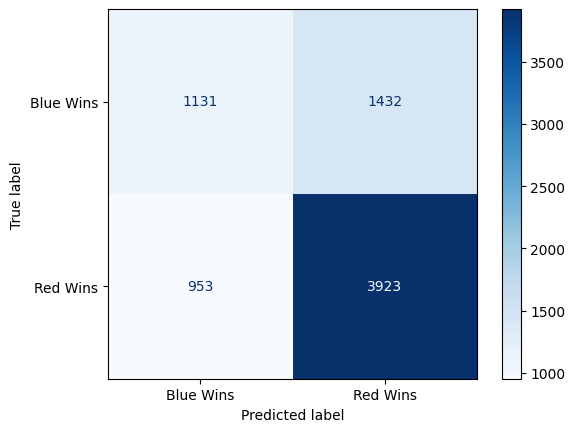

In [369]:
from sklearn.model_selection import cross_val_score

# Perform 10-fold cross-validation
cv_scores = cross_val_score(main_model, X, y, cv=10, scoring='f1')
cv_predictions = cross_val_predict(main_model, X, y, cv=10)

# Output the results
print("Cross-Validation F1-Score (mean):", cv_scores.mean())
print("Cross-Validation F1-Score (all folds):", cv_scores)

# Classification report and confusion matrix for aggregated predictions
print("\nClassification Report (Cross-Validation Predictions):")
print(classification_report(y, cv_predictions, target_names=["Blue Wins", "Red Wins"]))

conf_matrix = confusion_matrix(y, cv_predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=["Blue Wins", "Red Wins"])
disp.plot(cmap="Blues")

The model is fitted and ready for evaluation.

=== Metrics on Training Data ===
              precision    recall  f1-score   support

   Blue Wins       0.73      0.52      0.61      2046
    Red Wins       0.78      0.90      0.84      3905

    accuracy                           0.77      5951
   macro avg       0.76      0.71      0.72      5951
weighted avg       0.76      0.77      0.76      5951


=== Metrics on Test Data ===
              precision    recall  f1-score   support

   Blue Wins       0.59      0.43      0.50       517
    Red Wins       0.73      0.84      0.78       971

    accuracy                           0.70      1488
   macro avg       0.66      0.64      0.64      1488
weighted avg       0.68      0.70      0.68      1488

Test Accuracy: 0.70
Test F1-Score: 0.78

=== Predicted Class Distribution ===
Blue Wins: 25.27%
Red Wins: 74.73%


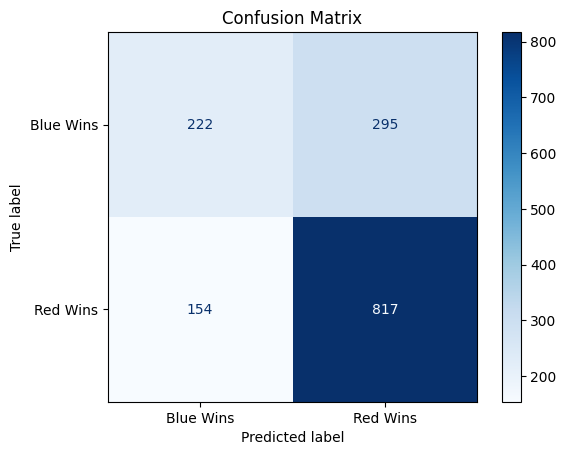


Feature Importances:
b_SLpM_total           0.231097
b_losses_total         0.140692
wins_total_diff        0.133308
b_age                  0.067590
r_sig_str_acc_total    0.046597
age_diff               0.046301
r_losses_total         0.043151
b_td_acc_total         0.038566
b_SApM_total           0.032014
r_SLpM_total           0.030841
b_wins_total           0.026045
b_sub_avg              0.022581
r_td_def_total         0.018814
r_wins_total           0.014377
b_weight               0.013345
r_SApM_total           0.013044
r_td_avg               0.012130
b_reach                0.011598
r_td_acc_total         0.009577
r_reach                0.008448
b_td_def_total         0.007707
b_sig_str_acc_total    0.007500
r_sub_avg              0.007291
b_str_def_total        0.005354
b_td_avg               0.004828
b_height               0.003393
r_str_def_total        0.002205
r_age                  0.001608
r_weight               0.000000
r_height               0.000000
dtype: float64


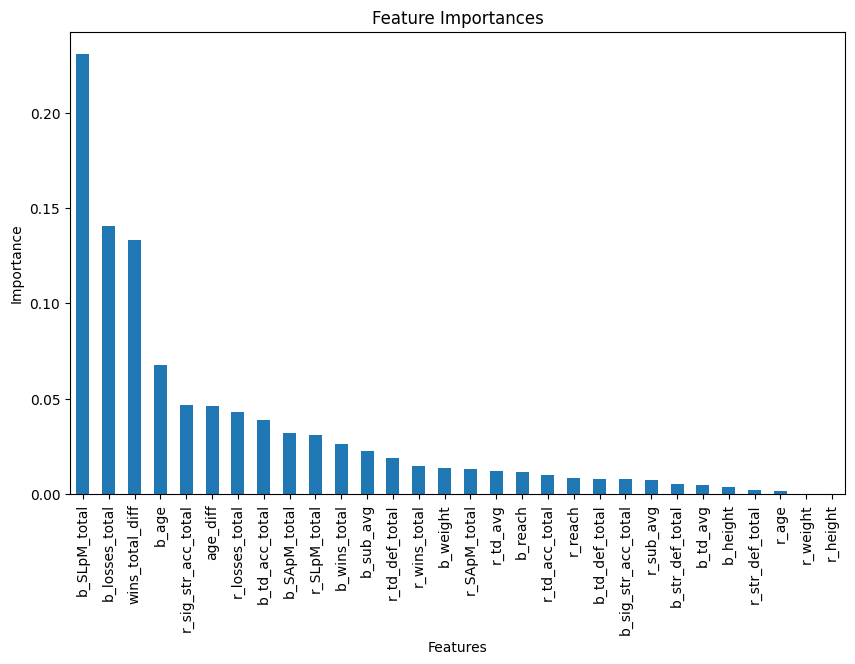


=== Final Metrics Summary ===
Training Accuracy: 0.77
Test Accuracy: 0.70
Training F1-Score: 0.84
Test F1-Score: 0.78


In [370]:
# Check if the model is fitted
try:
    check_is_fitted(main_model)
    print("The model is fitted and ready for evaluation.")
except:
    print("The model is not fitted yet. Please train the model first.")
    raise

# Metrics on training data
y_train_pred = main_model.predict(X_train)
print("\n=== Metrics on Training Data ===")
print(classification_report(y_train, y_train_pred, target_names=["Blue Wins", "Red Wins"]))

# Metrics on test data
y_test_pred = main_model.predict(X_test)
print("\n=== Metrics on Test Data ===")
print(classification_report(y_test, y_test_pred, target_names=["Blue Wins", "Red Wins"]))

# Accuracy and F1-Score for test data
test_accuracy = accuracy_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")
print(f"Test F1-Score: {test_f1:.2f}")

# Predicted percentages
predicted_counts = pd.Series(y_test_pred).value_counts()
predicted_percentages = (predicted_counts / len(y_test_pred)) * 100
print("\n=== Predicted Class Distribution ===")
print(f"Blue Wins: {predicted_percentages[0]:.2f}%")
print(f"Red Wins: {predicted_percentages[1]:.2f}%")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=["Blue Wins", "Red Wins"])
disp.plot(cmap="Blues")
plt.title("Confusion Matrix")
plt.show()

# Feature importances
feature_importances = pd.Series(main_model.feature_importances_, index=X.columns)
print("\nFeature Importances:")
print(feature_importances.sort_values(ascending=False))

# Visualize feature importances
feature_importances.sort_values(ascending=False).plot(kind='bar', figsize=(10, 6), title='Feature Importances')
plt.xlabel("Features")
plt.ylabel("Importance")
plt.show()

# Final metrics summary
print("\n=== Final Metrics Summary ===")
print(f"Training Accuracy: {accuracy_score(y_train, y_train_pred):.2f}")
print(f"Test Accuracy: {test_accuracy:.2f}")
print(f"Training F1-Score: {f1_score(y_train, y_train_pred):.2f}")
print(f"Test F1-Score: {test_f1:.2f}")


In [371]:
# Вывод гиперпараметров модели
print("\n=== Model Parameters ===")
params = main_model.get_params()
for param, value in params.items():
    print(f"{param}: {value}")

# Получить глубину дерева
print(f"\nTree Depth: {main_model.get_depth()}")

# Получить количество листьев
print(f"Number of Leaves: {main_model.get_n_leaves()}")

# Получить минимальное и максимальное значение глубины или данных
print(f"Minimum Feature Value: {X_train.min().min()}")
print(f"Maximum Feature Value: {X_train.max().max()}")

predicted_counts = pd.Series(y_test_pred).value_counts()
predicted_percentages = (predicted_counts / len(y_test_pred)) * 100
print("\n=== Predicted Class Distribution ===")
print(f"Blue Wins: {predicted_percentages[0]:.2f}%")
print(f"Red Wins: {predicted_percentages[1]:.2f}%")


=== Model Parameters ===
ccp_alpha: 0.0
class_weight: None
criterion: gini
max_depth: 7
max_features: None
max_leaf_nodes: None
min_impurity_decrease: 0.0
min_samples_leaf: 1
min_samples_split: 2
min_weight_fraction_leaf: 0.0
monotonic_cst: None
random_state: 42
splitter: best

Tree Depth: 7
Number of Leaves: 104
Minimum Feature Value: -241.0
Maximum Feature Value: 349.27

=== Predicted Class Distribution ===
Blue Wins: 25.27%
Red Wins: 74.73%


In [372]:
# Save the main model
import joblib

# Ensure the main model is trained
joblib.dump(main_model, "../models/testing_5_deth.pkl")
print("Main model saved as 'main_decision.pkl'")


Main model saved as 'main_decision.pkl'
